# Processamento de imagens com Spark e Postgres GIST

## Participantes

* Heitor Colichio
* Lucas Balieiro
* Lucas Roberto da Silva
* Vinícius Guimarães



### IMPORTAÇÕES E CONFIGURAÇÕES


In [ ]:
!pip install pyspark rasterio shapely psycopg2-binary rtree -q

In [ ]:
DATABASE_LINK = "postgresql://.........?sslmode=require"

In [ ]:
import os
import numpy as np
import rasterio
from rasterio.windows import Window
from shapely.geometry import Point, box
from rtree import index
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, udf
from pyspark.sql.types import StructType, StructField, StringType, FloatType, IntegerType, ArrayType
from google.colab import drive
import json
from concurrent.futures import ThreadPoolExecutor
import logging
import psycopg2
import matplotlib.pyplot as plt

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


![image.png](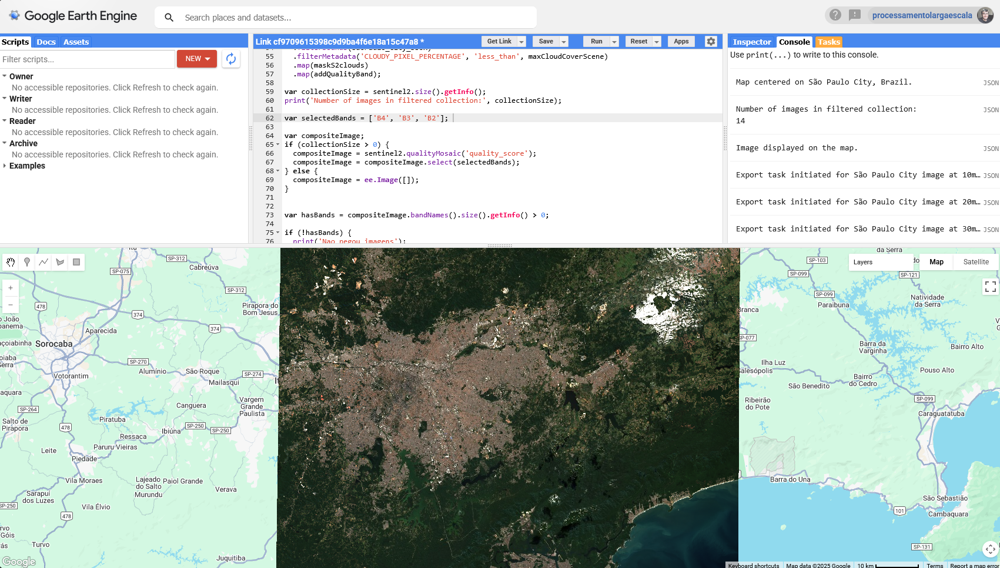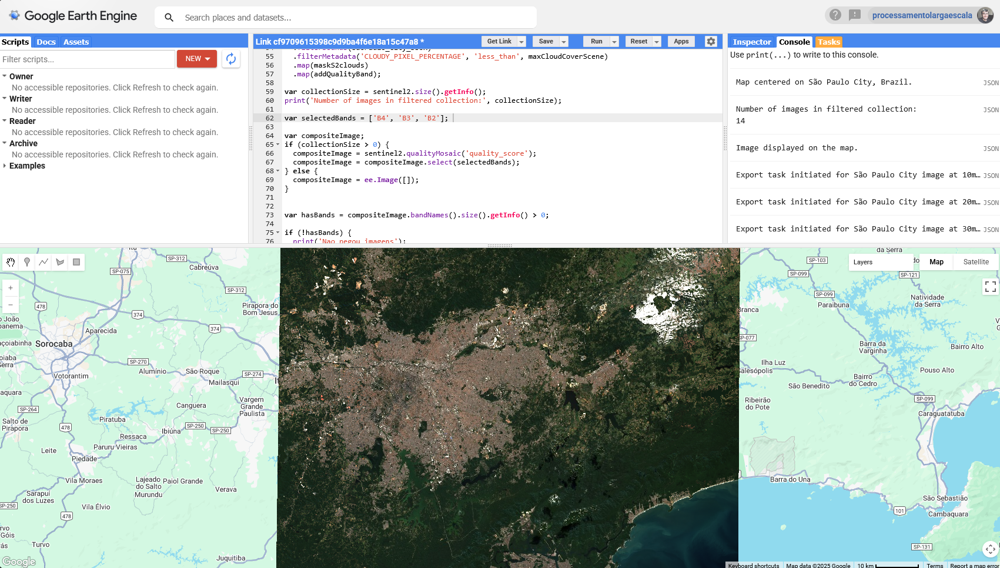)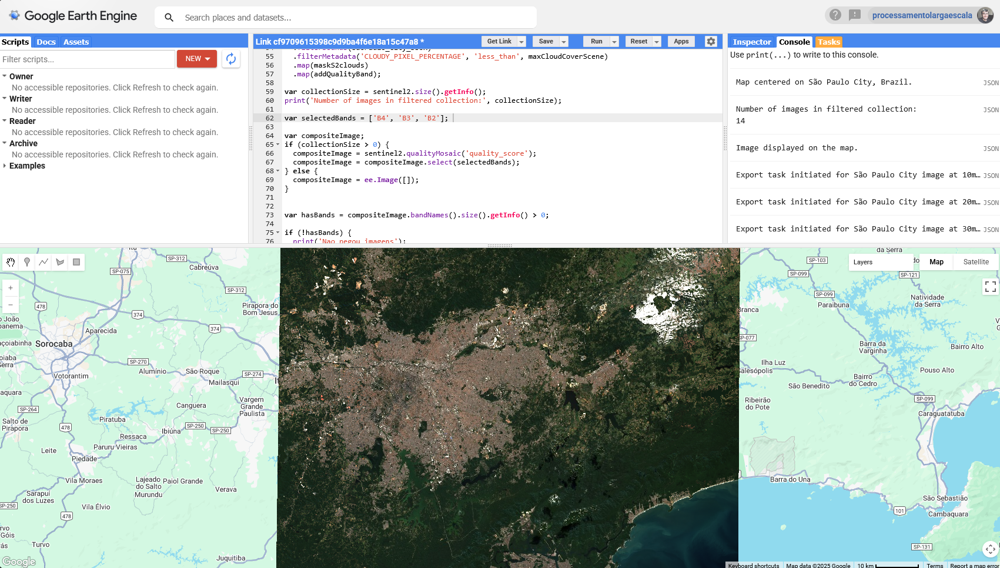

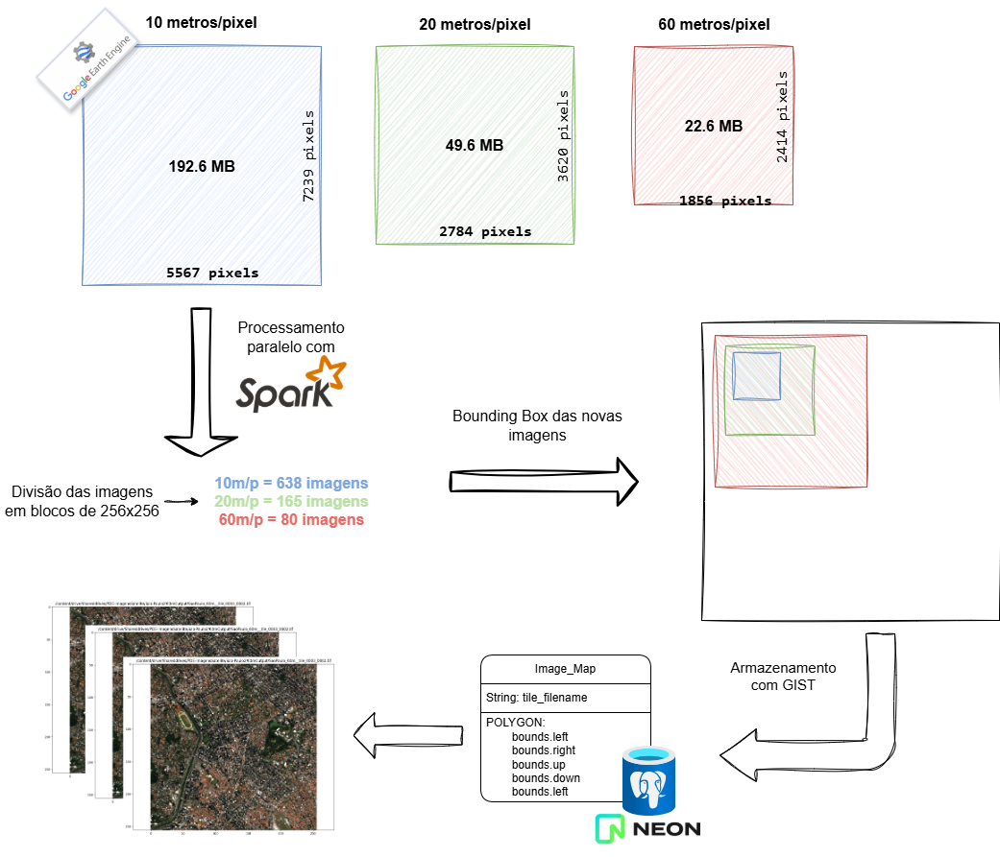

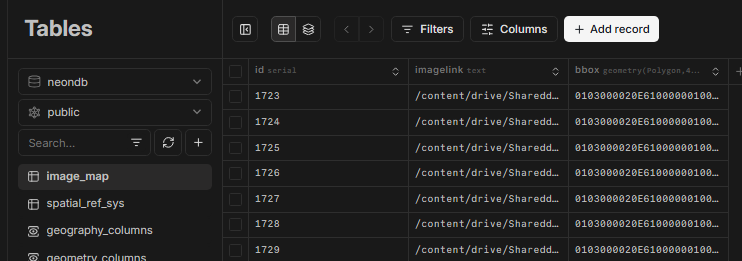

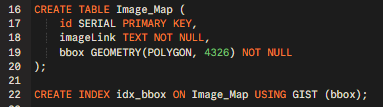

In [ ]:
def init_spark():
    # Inicializando o spark para o trabalho
    spark = SparkSession.builder \
        .appName("SatelliteImageProcessing") \
        .config("spark.sql.adaptive.enabled", "true") \
        .config("spark.sql.adaptive.coalescePartitions.enabled", "true") \
        .config("spark.serializer", "org.apache.spark.serializer.KryoSerializer") \
        .config("spark.sql.execution.arrow.pyspark.enabled", "true") \
        .config("spark.master", "local[3]") \
        .getOrCreate()

    spark.sparkContext.setLogLevel("WARN")
    return spark

### REALIZA A DIVISÃO DE UMA IMAGEM EM VÁRIAS SUBPARTES (TILES)

In [ ]:
def divideImageSpark(image_info):
    # Adicionando a imagem no banco de dados, juntamente com sua bounding box
    conn = psycopg2.connect(DATABASE_LINK)
    cursor = conn.cursor()

    # Image_info é um dicinário por conta de ser mais fácil de serializar
    prefix = image_info['prefix']
    imagePath = image_info['imagePath']
    outputFolder = image_info['outputFolder']
    scale = image_info['scale']

    tileSize = 256
    tile_width = tileSize
    tile_height = tileSize

    results = []

    try:
        os.makedirs(outputFolder, exist_ok=True)

        # Abrindo a imagem
        with rasterio.open(imagePath) as src:
            original_width = src.width
            original_height = src.height

            # Calculando número de linhas e colunas
            num_cols = (original_width + tile_width - 1) // tile_width
            num_rows = (original_height + tile_height - 1) // tile_height

            out_profile = src.profile
            out_profile.update(driver='GTiff',
                              width=tile_width,
                              height=tile_height,
                              compress='None')

            for i in range(num_rows):
                for j in range(num_cols):
                    row_offset = i * tile_height
                    col_offset = j * tile_width

                    # Pegando somente o tile atual (considera linha e coluna)
                    window = Window(col_offset, row_offset, tile_width, tile_height)
                    tile_data = src.read(window=window)

                    out_transform = src.window_transform(window)
                    out_profile.update(transform=out_transform)

                    tile_filename = os.path.join(outputFolder, f"{prefix}_tile_{i:04d}_{j:04d}.tif")

                    # Salvando o tile dentro do Google Drive
                    with rasterio.open(tile_filename, 'w', **out_profile) as dst:
                        dst.write(tile_data)

                    # Pegando coordenadas (Bounding box) do tile
                    with rasterio.open(tile_filename) as tile_src:
                        bounds = tile_src.bounds
                        bbox = (bounds.left, bounds.bottom, bounds.right, bounds.top)

                    results.append({
                        'tile_filename': tile_filename,
                        'bbox': bbox,
                        'resolution': scale,
                        'row': i,
                        'col': j,
                        'original_image': imagePath
                    })

                    # Salvando representação do tile para dentro do banco de dados
                    # Isso é importante pois iremos usar o GIST para realizar a busca posteriormente.
                    cursor.execute(f"""
                        INSERT INTO Image_Map (imageLink, bbox)
                        VALUES (
                            '{tile_filename}',
                            ST_SetSRID(
                                ST_MakePolygon(
                                    ST_MakeLine(ARRAY[
                                        ST_MakePoint({bounds.left}, {bounds.bottom}),
                                        ST_MakePoint({bounds.right}, {bounds.bottom}),
                                        ST_MakePoint({bounds.right}, {bounds.top}),
                                        ST_MakePoint({bounds.left}, {bounds.top}),
                                        ST_MakePoint({bounds.left}, {bounds.bottom})
                                    ])
                                ),
                                4326
                            )
                        );
                    """)

                    # Confirma a transação no banco
                    conn.commit()

        return results

    except Exception as e:
        return [{'error': str(e), 'imagePath': imagePath}]

### RODA O PIPELINE COM SPARK, PROCESSANDO CADA IMAGEM EM PARALELO

In [ ]:
def main_spark_pipeline():
    """
    Main pipeline that processes images in parallel using Spark RDD and divideImageSpark function.
    """
    # Inicializa o spark para processar as imagens em paralelo usando o Spark RDD.
    # Spark RDD = Spark Resilient Distributed Dataset.
    # Um RDD é uma coleção imutável de objetos que pode ser dividida em partições
    # e processada em paralelo por vários nós ou núcleos.
    spark = init_spark()

    try:
        if not os.path.exists('/content/drive'):
            drive.mount('/content/drive')

        base_path = "/content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/"

        image_configs = []

        # Configurações que incluem a pasta onde as imagens estão,
        # pasta para serem salvos os tiles e escala da imagem de satélite utilizada.
        resolution_configs = [
            {'folder': '10m/', 'output': '10mOutput', 'scale': 10},
            {'folder': '20m/', 'output': '20mOutput', 'scale': 20},
            {'folder': '60m/', 'output': '60mOutput', 'scale': 60}
        ]

        # Para cada imagem, iremos criar a configuração para a imagem e salvar dentro de image_configs
        for config in resolution_configs:
            folder_path = base_path + config['folder']
            if os.path.exists(folder_path):
                images = os.listdir(folder_path)
                for image in images:
                    if image.endswith('.tif'):
                        image_path = folder_path + image
                        image_name = image.split(".tif")[0]

                        image_configs.append({
                            'prefix': image_name,
                            'imagePath': image_path,
                            'outputFolder': base_path + config['output'],
                            'scale': config['scale']
                        })

        print(f"Processando {len(image_configs)} imagens com Spark RDD!")

        if not image_configs:
            print("Configuração não encontrada para a imagem. Saindo do pipeline!")
            return None

        # Realizando o processamento em paralelo com o Spark RDD
        image_configs_rdd = spark.sparkContext.parallelize(image_configs)

        # O foreach aciona divideImageSpark para ser executado em paralelo para cada imagem
        image_configs_rdd.foreach(divideImageSpark)

        print("Todas as imagens foram processadas em paralelo.")

        return None

    except Exception as e:
        print(f"Erro ocorreu durante a execução do pipeline: {e}")
        return None

    finally:
        if 'spark' in locals() and spark:
            spark.stop()

In [ ]:
tiles_df = main_spark_pipeline()

Processing 3 images with Spark RDD...
All images processed in parallel.


### EXIBINDO IMAGEM

In [ ]:
def showTiffAsRGBImage(image_path_on_drive):
  try:
        with rasterio.open(image_path_on_drive) as src:

            # Verificar quantas bandas tem o arquivo
            print(f"Arquivo '{os.path.basename(image_path_on_drive)}' tem {src.count} banda(s).")

            # RGB (Banda 1, Banda 2, Banda 3).
            # Sentinel-2 RGB exporta dados do GEE (B4, B3, B2), que ficam:
            # src.read(1) é Red (B4)
            # src.read(2) é Green (B3)
            # src.read(3) é Blue (B2)

            if src.count >= 3:
                red_band = src.read(1)  # Red
                green_band = src.read(2) # Green
                blue_band = src.read(3)  # Blue

                # Empilha as bandas em uma imagem RGB para o matplotlib.
                # O Matplotlib espera o formato (altura, largura, canais).
                # Os valores dos pixels do Sentinel-2 podem ser altos (por exemplo, até 10000).
                # Esses valores são normalizados para o intervalo de 0 a 1, ficando melhores com o imshow.
                # Usamos o mesmo intervalo mínimo/máximo da visualização do Google Earth Engine (0-2500 para Sentinel-2)
                max_val = 2500

                # Valores das bandas normalizadas para o range de 0-1
                rgb_image_normalized = np.stack([
                    np.clip(red_band / max_val, 0, 1),
                    np.clip(green_band / max_val, 0, 1),
                    np.clip(blue_band / max_val, 0, 1)
                ], axis=-1)

                # Mostrando imagem
                plt.figure(figsize=(12, 10))
                plt.imshow(rgb_image_normalized)
                plt.title(image_path_on_drive)
                plt.axis('equal')
                plt.show()

            else:
                print(f"Erro: O GeoTIFF em '{image_path_on_drive}' não contém bandas suficientes para visualização RGB (detectadas {src.count} banda(s)).")

  except rasterio.errors.RasterioIOError as e:
      print(f"Erro ao ler o GeoTIFF com rasterio: {e}")
      print("Isso pode acontecer se o arquivo estiver realmente corrompido, não for um GeoTIFF válido, ou ainda houver problemas de permissões.")
  except Exception as e:
      print(f"Ocorreu um erro inesperado durante o processamento da imagem: {e}")




### REALIZANDO BUSCAS DE IMAGENS COM BASE NAS COORDENADAS

-----------------------------------------------------------------------
----------------------------NEO QUÍMICA---------------------------------
id: 1597, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/60mOutput/SaoPaulo_60m__tile_0002_0005.tif
Arquivo 'SaoPaulo_60m__tile_0002_0005.tif' tem 3 banda(s).


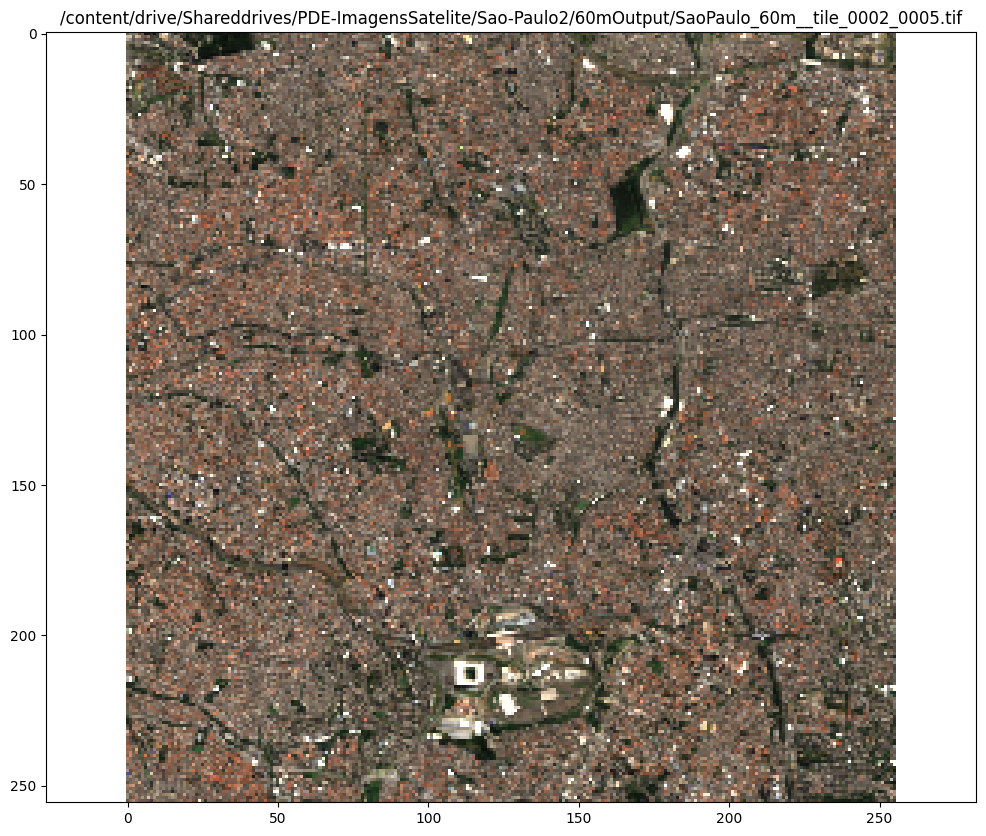

id: 1328, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/20mOutput/SaoPaulo_20m__tile_0004_0008.tif
Arquivo 'SaoPaulo_20m__tile_0004_0008.tif' tem 3 banda(s).


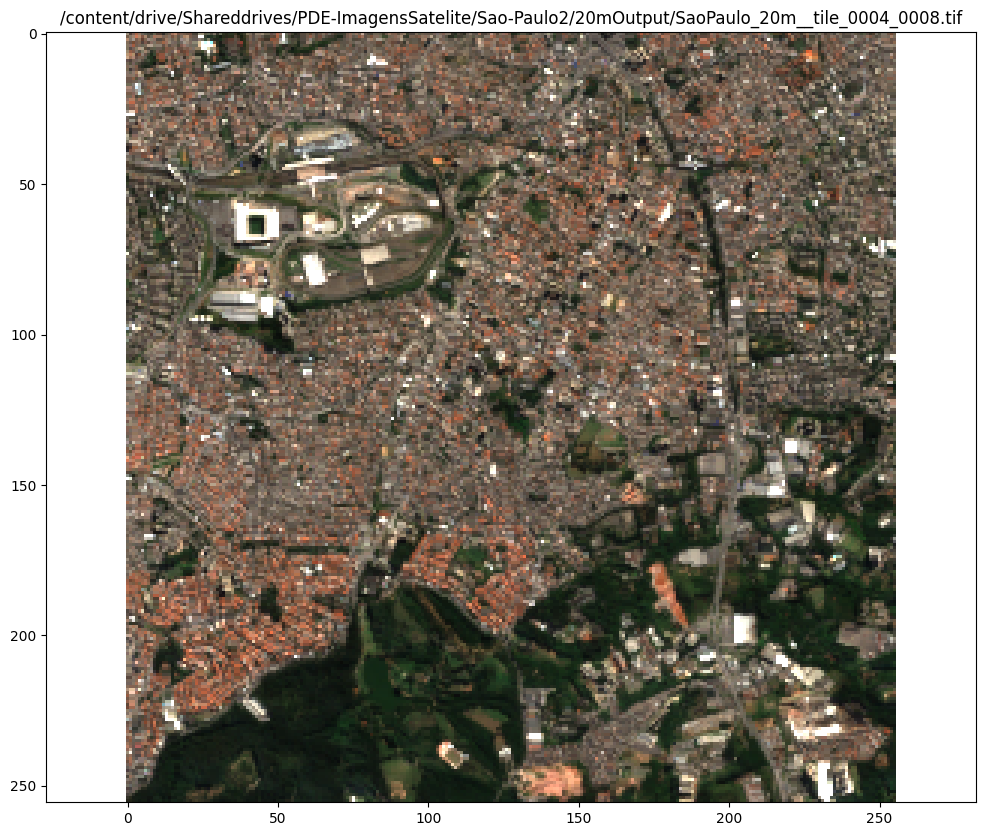

id: 1606, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/10mOutput/SaoPaulo_10m__tile_0008_0016.tif
Arquivo 'SaoPaulo_10m__tile_0008_0016.tif' tem 3 banda(s).


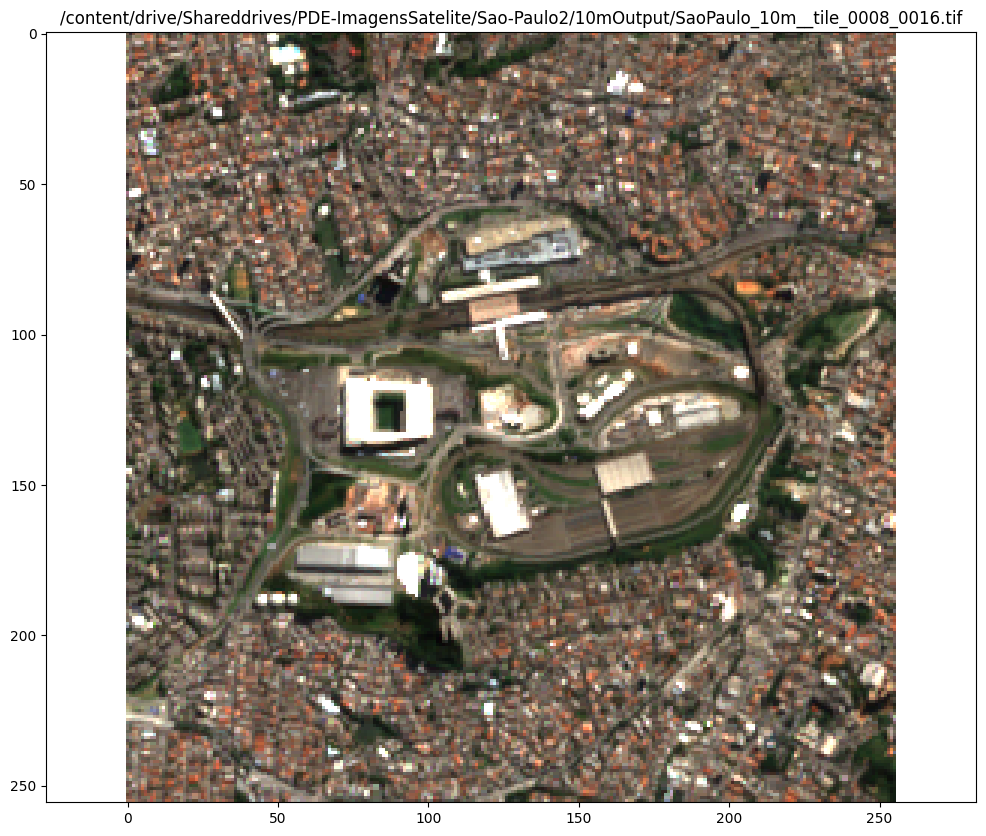










-----------------------------------------------------------------------
----------------------------IBIRAPUERA---------------------------------
id: 1342, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/20mOutput/SaoPaulo_20m__tile_0005_0004.tif
Arquivo 'SaoPaulo_20m__tile_0005_0004.tif' tem 3 banda(s).


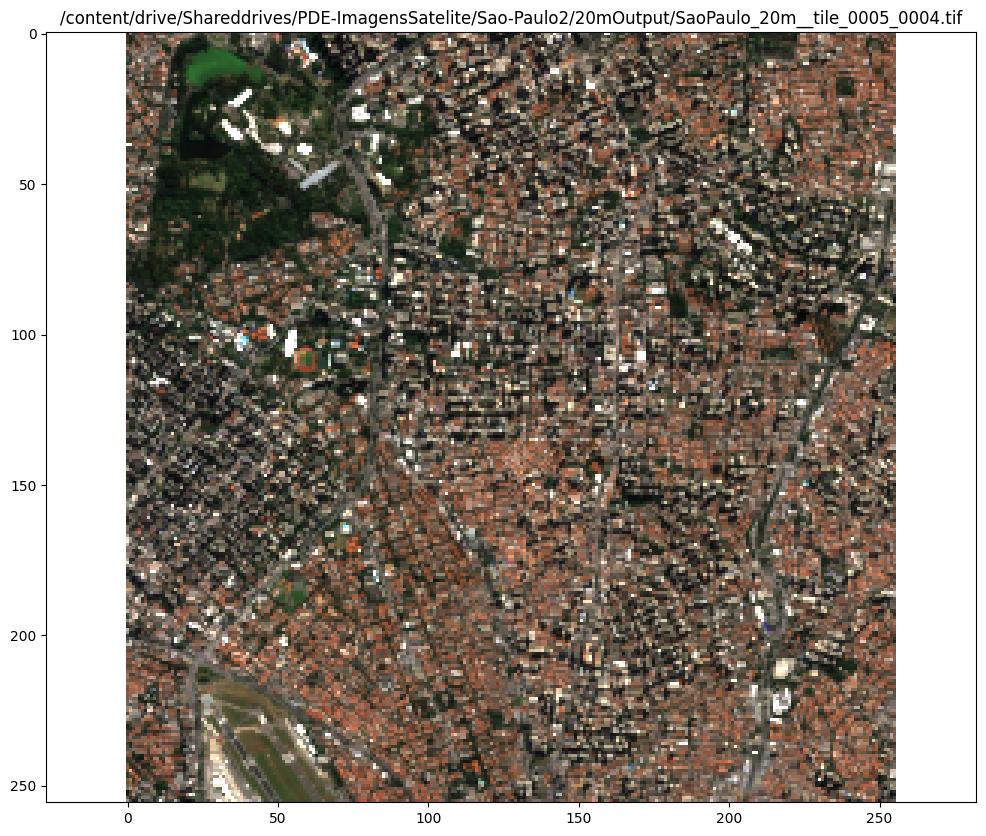

id: 1607, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/60mOutput/SaoPaulo_60m__tile_0003_0002.tif
Arquivo 'SaoPaulo_60m__tile_0003_0002.tif' tem 3 banda(s).


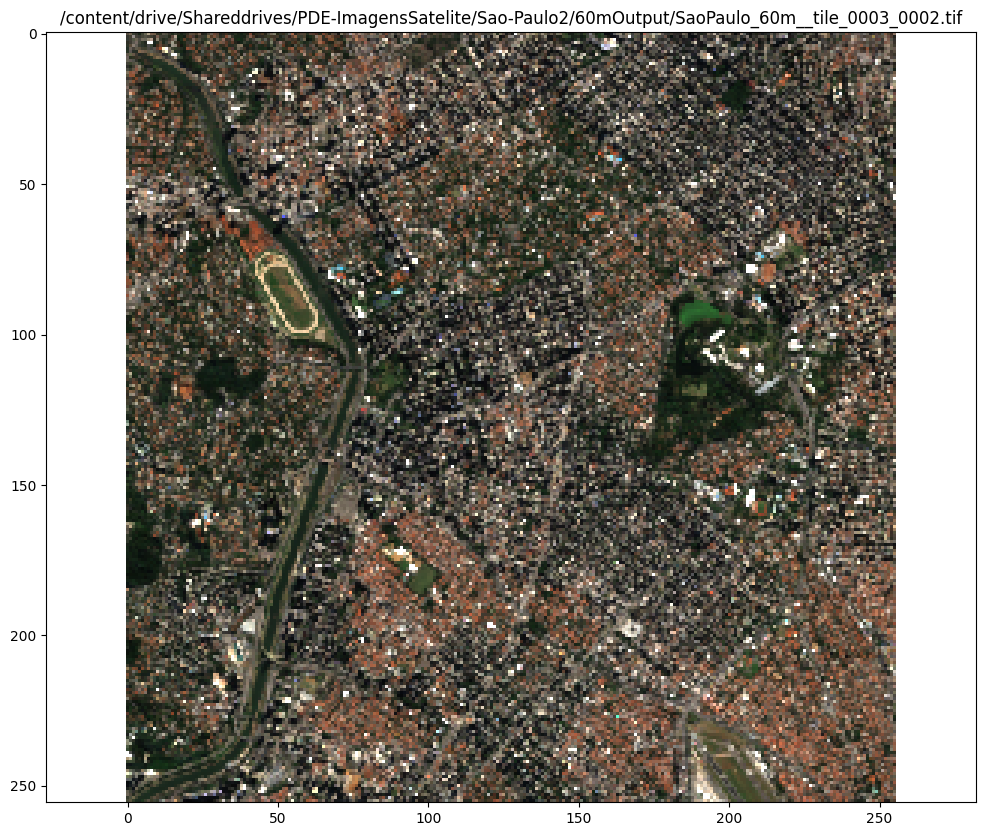

id: 1678, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/10mOutput/SaoPaulo_10m__tile_0010_0008.tif
Arquivo 'SaoPaulo_10m__tile_0010_0008.tif' tem 3 banda(s).


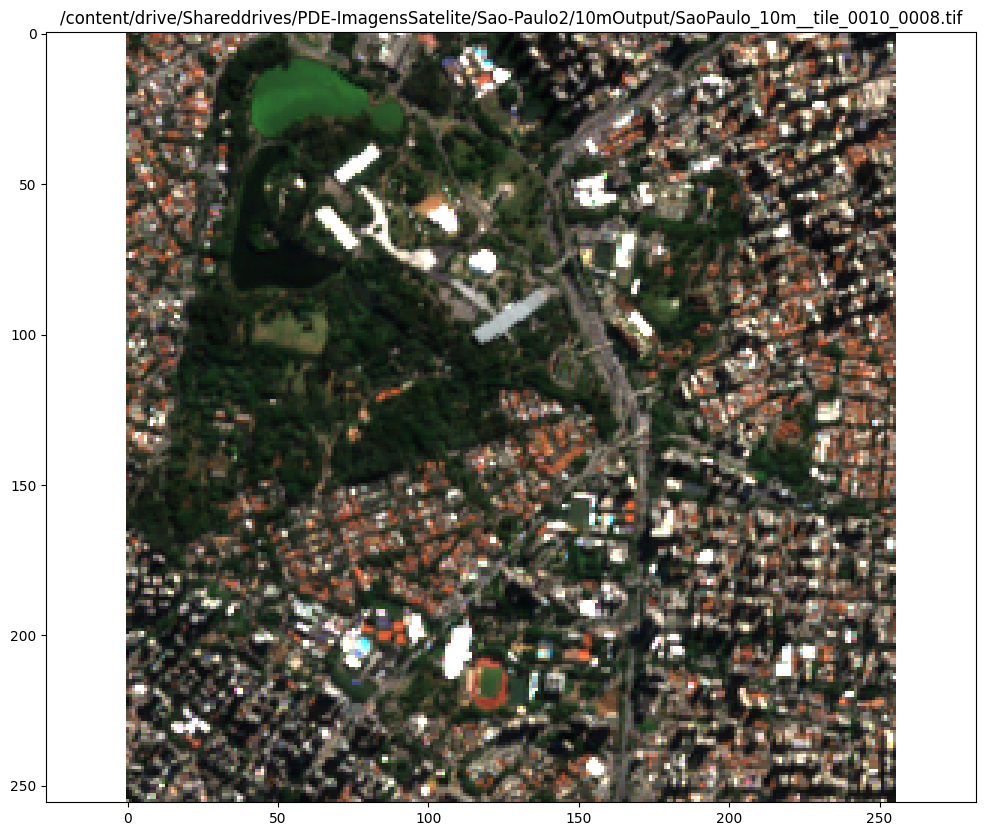

-----------------------------------------------------------------------









-----------------------------------------------------------------------
----------------------------MORUMBI---------------------------------
id: 1338, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/20mOutput/SaoPaulo_20m__tile_0005_0002.tif
Arquivo 'SaoPaulo_20m__tile_0005_0002.tif' tem 3 banda(s).


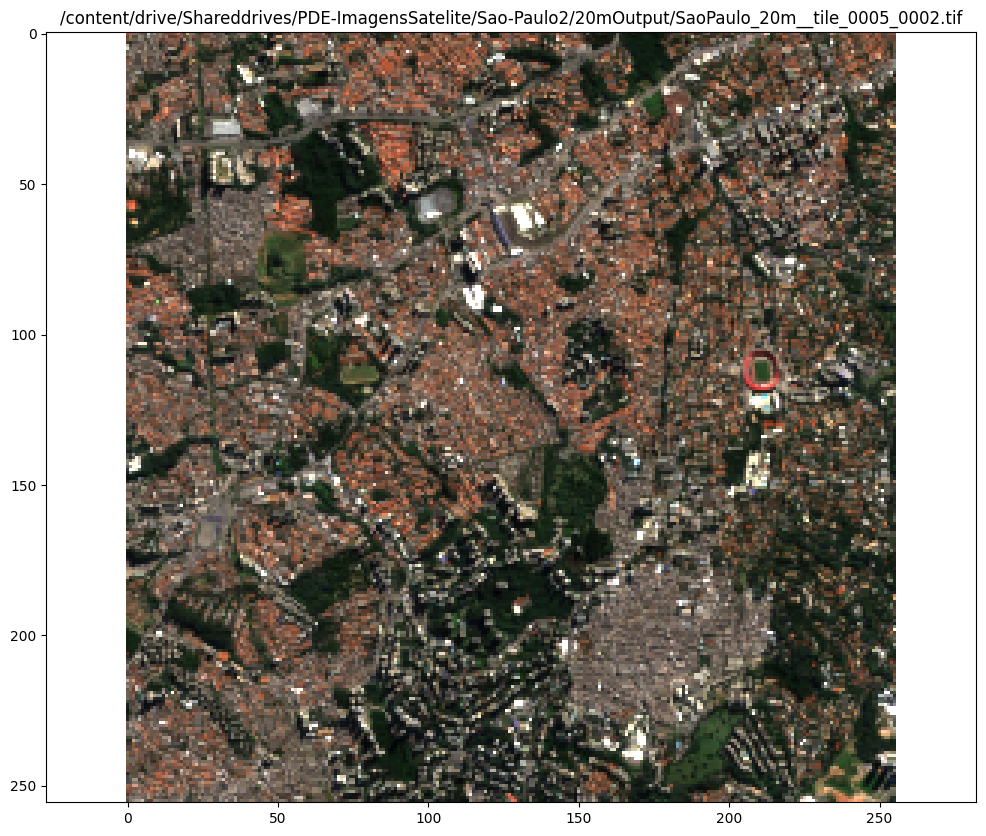

id: 1605, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/60mOutput/SaoPaulo_60m__tile_0003_0001.tif
Arquivo 'SaoPaulo_60m__tile_0003_0001.tif' tem 3 banda(s).


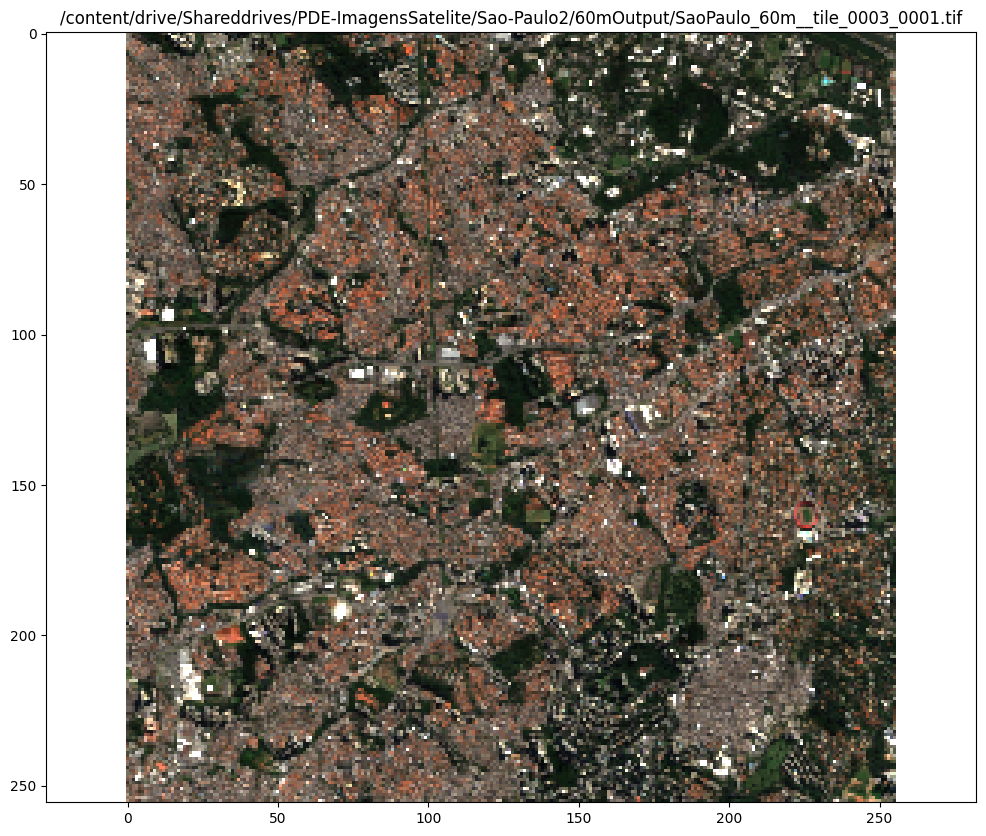

id: 1672, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/10mOutput/SaoPaulo_10m__tile_0010_0005.tif
Arquivo 'SaoPaulo_10m__tile_0010_0005.tif' tem 3 banda(s).


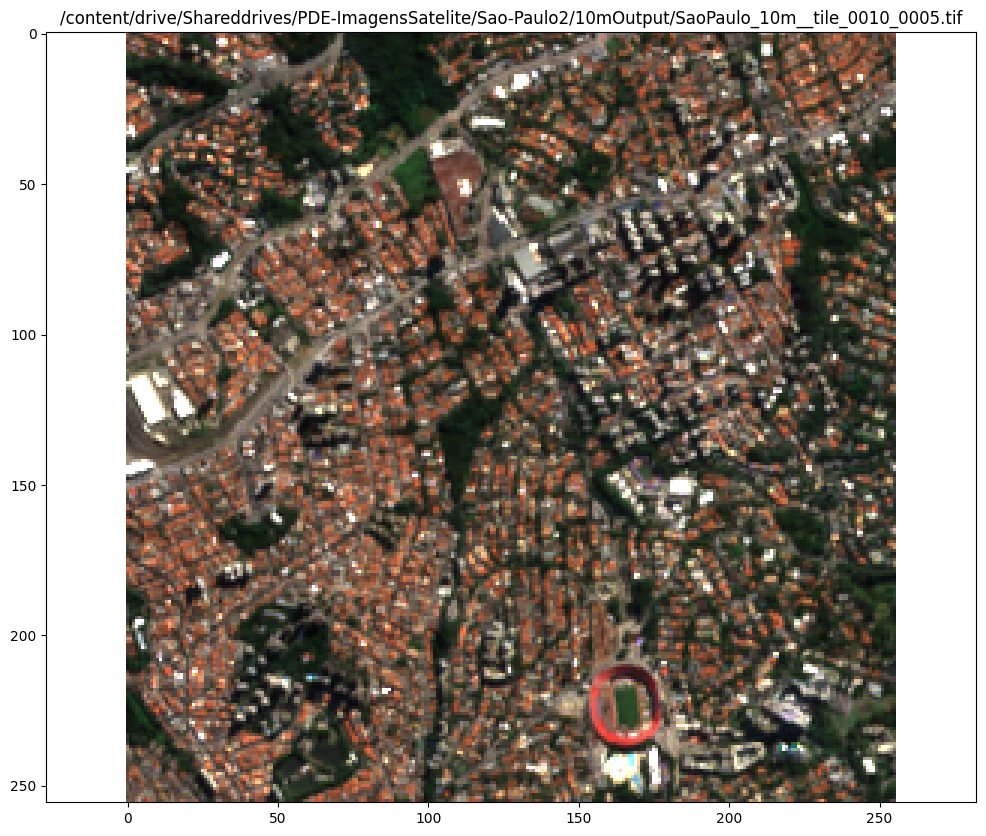

In [ ]:
# Criando busca com base nas imagens que temos dentro do banco de dados
# Buscar todas as imagens que contém uma determinada coordenada


# Adicionando a imagem no banco de dados, juntamente com sua bounding box
conn = psycopg2.connect(DATABASE_LINK)
cursor = conn.cursor()

#---------------------------------------------------------------------------------
print("-----------------------------------------------------------------------")
print("----------------------------NEO QUÍMICA---------------------------------")
# Executando comando SQL - NEO QUÍMICA
cursor.execute(f"""
  SELECT id, imageLink
  FROM Image_Map
  WHERE ST_Contains(
      bbox,
      ST_SetSRID(ST_MakePoint(-46.473617685750085, -23.54509694075709), 4326)
  );
""")

# Pega todos os resultados
results = cursor.fetchall()

for row in results:
    print(f"id: {row[0]}, imageLink: {row[1]}")
    showTiffAsRGBImage(row[1])

#---------------------------------------------------------------------------------

print("\n\n\n\n\n\n\n\n\n-----------------------------------------------------------------------")
print("----------------------------IBIRAPUERA---------------------------------")
# Executando comando SQL - IBIRAPUERA
cursor.execute(f"""
  SELECT id, imageLink
  FROM Image_Map
  WHERE ST_Contains(
      bbox,
      ST_SetSRID(ST_MakePoint(-46.65825800647615, -23.58603878292266), 4326)
  );
""")

# Pega todos os resultados
results = cursor.fetchall()

for row in results:
    print(f"id: {row[0]}, imageLink: {row[1]}")
    showTiffAsRGBImage(row[1])

print("-----------------------------------------------------------------------")

#---------------------------------------------------------------------------------

print("\n\n\n\n\n\n\n\n\n-----------------------------------------------------------------------")
print("----------------------------MORUMBI---------------------------------")
# Executando comando SQL - IBIRAPUERA
cursor.execute(f"""
  SELECT id, imageLink
  FROM Image_Map
  WHERE ST_Contains(
      bbox,
      ST_SetSRID(ST_MakePoint(-46.720105145719074, -23.60011025371646), 4326)
  );
""")

# Pega todos os resultados
results = cursor.fetchall()

for row in results:
    print(f"id: {row[0]}, imageLink: {row[1]}")
    showTiffAsRGBImage(row[1])

# Fecha cursor e conexão
cursor.close()
conn.close()

id: 1316, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/20mOutput/SaoPaulo_20m__tile_0004_0002.tif
Arquivo 'SaoPaulo_20m__tile_0004_0002.tif' tem 3 banda(s).


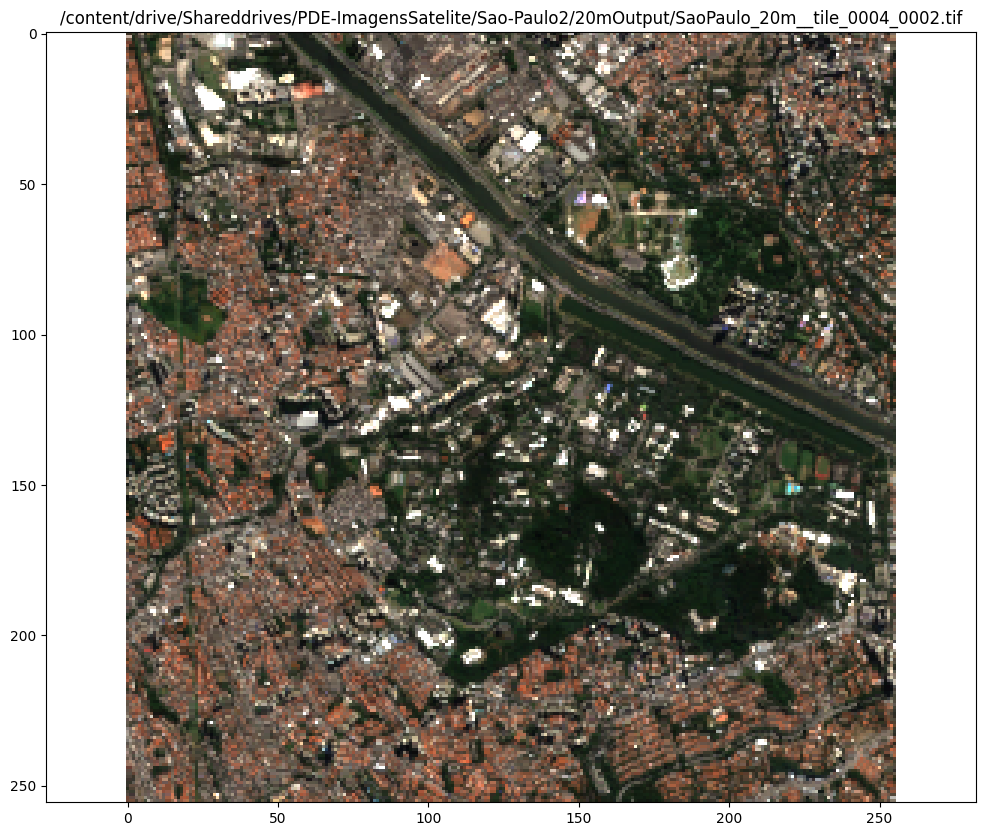

id: 1605, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/60mOutput/SaoPaulo_60m__tile_0003_0001.tif
Arquivo 'SaoPaulo_60m__tile_0003_0001.tif' tem 3 banda(s).


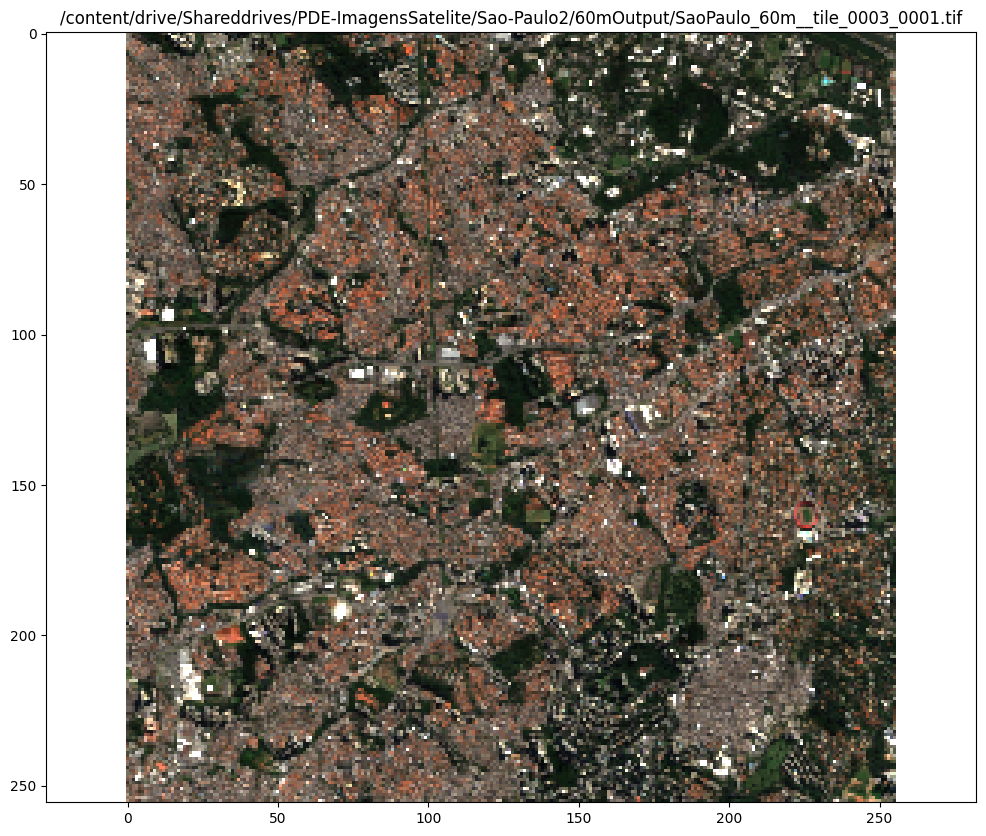

id: 1628, imageLink: /content/drive/Shareddrives/PDE-ImagensSatelite/Sao-Paulo2/10mOutput/SaoPaulo_10m__tile_0009_0005.tif
Arquivo 'SaoPaulo_10m__tile_0009_0005.tif' tem 3 banda(s).


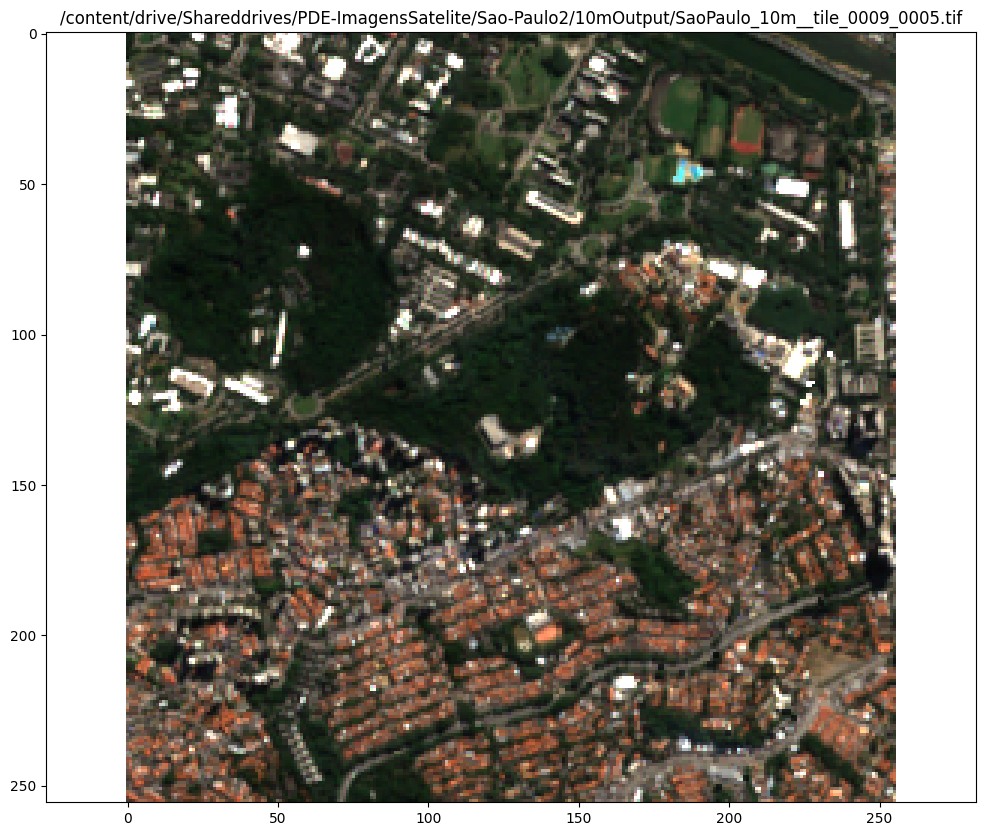

In [ ]:
conn = psycopg2.connect(DATABASE_LINK)
cursor = conn.cursor()

cursor.execute(f"""
  SELECT id, imageLink
  FROM Image_Map
  WHERE ST_Contains(
      bbox,
      ST_SetSRID(ST_MakePoint(-46.73206031865963, -23.56017835019752), 4326)
  );
""")

results = cursor.fetchall()

for row in results:
    print(f"id: {row[0]}, imageLink: {row[1]}")
    showTiffAsRGBImage(row[1])

# Fecha cursor e conexão
cursor.close()
conn.close()